In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Dropout
from tensorflow.keras.optimizers import Adam
import os
import datetime
import pytz
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
from tensorflow import keras
from sklearn.preprocessing import MinMaxScaler
import shap
from scipy.stats import zscore

In [1]:
#TODO: define your path to data file
file_name = ''

In [ ]:
# Read the CSV while preserving original formatting
df = pd.read_csv(file_name, header=None, dtype=str, keep_default_na=False)

# Assign column names for clarity
df.columns = ["frequency", "decibel", "latitude", "longitude", "timestamp"]

# Convert data types
df["frequency"] = pd.to_numeric(df["frequency"], errors="coerce")
df["decibel"] = pd.to_numeric(df["decibel"], errors="coerce")
df["latitude"] = pd.to_numeric(df["latitude"], errors="coerce")
df["longitude"] = pd.to_numeric(df["longitude"], errors="coerce")
df["timestamp"] = pd.to_datetime(df["timestamp"], errors="coerce")

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52416 entries, 0 to 52415
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype              
---  ------     --------------  -----              
 0   frequency  52416 non-null  float64            
 1   decibel    52416 non-null  float64            
 2   latitude   52416 non-null  float64            
 3   longitude  52416 non-null  float64            
 4   timestamp  52416 non-null  datetime64[ns, UTC]
dtypes: datetime64[ns, UTC](1), float64(4)
memory usage: 2.0 MB


## Are there duplicate data points?

In [ ]:
# Find duplicate rows (all 5 columns must be identical)
duplicate_rows = df[df.duplicated(keep=False)]  # `keep=False` keeps all occurrences

# Display the duplicate rows
if not duplicate_rows.empty:
    print("Duplicate Data Points Found:")
    display(duplicate_rows)  # Works in Colab to show DataFrame
else:
    print("No duplicate rows found.")

Duplicate Data Points Found:


,frequency,decibel,latitude,longitude,timestamp
8841,1.600000e+09,-78.125,43.519390,-80.502389,2025-02-25 23:22:42+00:00
8842,1.600000e+09,-78.125,43.519390,-80.502389,2025-02-25 23:22:42+00:00
9739,1.600000e+09,-77.625,43.519390,-80.502389,2025-02-25 23:23:34+00:00
9740,1.600000e+09,-77.625,43.519390,-80.502389,2025-02-25 23:23:34+00:00
10637,1.600000e+09,-77.625,43.519390,-80.502389,2025-02-25 23:23:52+00:00
...,...,...,...,...,...
50745,3.200000e+09,-74.594,43.488884,-80.491480,2025-02-26 12:49:54+00:00
52193,3.200000e+09,-74.656,43.488884,-80.491480,2025-02-28 21:56:38+00:00
52194,3.200000e+09,-74.656,43.488884,-80.491480,2025-02-28 21:56:38+00:00
52364,5.600000e+09,-72.656,43.488884,-80.491480,2025-02-28 21:56:38+00:00


## Time Frequency Decibel graph

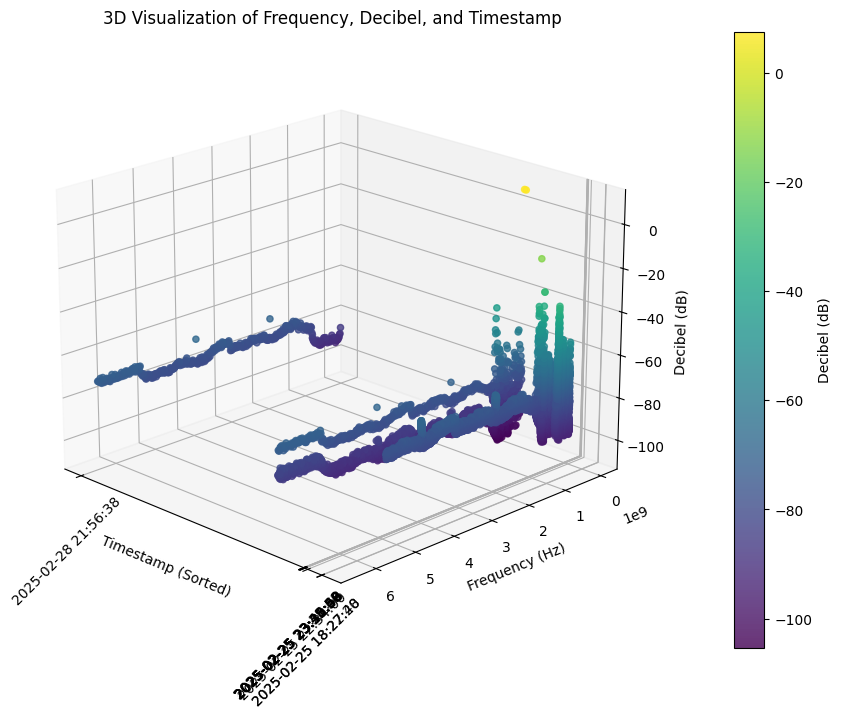

In [ ]:


# Drop rows with missing values
df = df.dropna(subset=["frequency", "decibel", "timestamp"])

# Sort by timestamp
df = df.sort_values(by="timestamp")

# Convert timestamp to numerical format for plotting
df["timestamp_numeric"] = df["timestamp"].map(datetime.datetime.timestamp)

# Create a 3D scatter plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection="3d")

# Plot data
scatter = ax.scatter(df["timestamp_numeric"], df["frequency"], df["decibel"],
                     c=df["decibel"], cmap="viridis", alpha=0.8)

# Set axis labels
ax.set_xlabel("Timestamp (Sorted)")
ax.set_ylabel("Frequency (Hz)")
ax.set_zlabel("Decibel (dB)")
ax.set_title("3D Visualization of Frequency, Decibel, and Timestamp")

# Format X-axis (timestamps)
ax.set_xticks(df["timestamp_numeric"][::max(1, len(df) // 10)])  # Reduce number of labels
ax.set_xticklabels(df["timestamp"].dt.strftime('%Y-%m-%d %H:%M:%S')[::max(1, len(df) // 10)], rotation=45)

# Rotate for better visualization
ax.view_init(elev=20, azim=135)

# Add color bar to represent decibel intensity
cbar = fig.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label("Decibel (dB)")

# Show plot
plt.show()

In [ ]:
df = df.drop_duplicates()
# Drop rows with missing values
df = df.dropna(subset=["frequency", "decibel"])

# Sort by frequency in ascending order
df = df.sort_values(by="frequency")

# Create an interactive scatter plot (Display frequency in sorted order)
fig = px.scatter(
    df,
    x="frequency",  # X-axis: Frequency (sorted)
    y="decibel",  # Y-axis: Decibel (Signal Strength)
    hover_data={
        "frequency": True,   # Show frequency
        "decibel": True,     # Show decibel
        "latitude": True,    # Show latitude
        "longitude": True,   # Show longitude
        "timestamp": True    # Show timestamp
    },
    title="Interactive Frequency vs. Signal Strength (Decibel)",
    labels={"frequency": "Frequency (Hz)", "decibel": "Decibel (dB)"},
)

# Prevent Plotly from applying automatic formatting
fig.update_layout(
    xaxis=dict(type="category"),  # Keeps frequency values as exact numbers
)

# Show the interactive plot
fig.show()

## Anomaly detection

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import StandardScaler

In [ ]:
# Drop duplicate rows and missing values
df = df.drop_duplicates()
df = df.dropna(subset=["frequency", "decibel"])

# Sort by frequency to analyze trends
df = df.sort_values(by="frequency")

### **Rolling Mean & Standard Deviation Method -> capture sudden jumps**
df["rolling_mean"] = df["decibel"].rolling(window=10, center=True).mean()
df["rolling_std"] = df["decibel"].rolling(window=10, center=True).std()
df["spike_rolling"] = (df["decibel"] > df["rolling_mean"] + 2 * df["rolling_std"])  # Spike if above threshold

### **IQR (Interquartile Range) Method -> finds very high or low points**
Q1 = df["decibel"].quantile(0.25)
Q3 = df["decibel"].quantile(0.75)
IQR = Q3 - Q1
df["spike_iqr"] = (df["decibel"] < (Q1 - 1.5 * IQR)) | (df["decibel"] > (Q3 + 1.5 * IQR))

### ** Isolation Forest (Machine Learning) -> spot anomalies**
iso_forest = IsolationForest(contamination=0.05, random_state=45)
df["is_anomaly"] = iso_forest.fit_predict(df[["frequency", "decibel"]])  # -1 = anomaly, 1 = normal

# Combine results: A point is an anomaly if any method detects a spike
df["final_anomaly"] = df["spike_rolling"] | df["spike_iqr"] | (df["is_anomaly"] == -1)

# Color legend
df["anomaly_label"] = df["final_anomaly"].map({True: "Anomaly (Spike)", False: "Normal Data"})

# Separate anomalies from normal data
df_anomalies = df[df["final_anomaly"]]

# Convert frequency from Hz to GHz for readability purposes for larger numbers
df["frequency_MHz"] = df["frequency"] / 1e6

# Create an interactive scatter plot with anomaly points highlighted
fig = px.scatter(
    df,
    x="frequency_MHz",
    y="decibel",
    color="anomaly_label",
    hover_data={
        "frequency": True,
        "frequency_MHz": True,
        "decibel": True,
        "latitude": True,
        "longitude": True,
        "timestamp": True
    },
    title="Detected Spikes in Frequency vs. Decibel Data",
    labels={"frequency": "Frequency (Hz)", "decibel": "Decibel (dB)", "anomaly_label": "Data Type"},
    color_discrete_map={"Normal Data": "blue", "Anomaly (Spike)": "red"},
)

# Show the interactive plot
fig.show()

# Display detected anomalies in Google Colab
if not df_anomalies.empty:
    print("\nDetected Spike Anomalies in Decibel Values:\n")
    display(df_anomalies)
else:
    print("\nNo anomalies detected.")




Detected Spike Anomalies in Decibel Values:



,frequency,decibel,latitude,longitude,timestamp,timestamp_numeric,rolling_mean,rolling_std,spike_rolling,spike_iqr,is_anomaly,final_anomaly,anomaly_label,frequency_GHz
49518,1.000000e+06,7.483,43.488884,-80.491480,2025-02-26 12:30:42+00:00,1.740573e+09,NaN,NaN,False,True,-1,True,Anomaly (Spike),0.001000
50967,1.000000e+06,7.519,43.488884,-80.491480,2025-02-26 13:00:08+00:00,1.740575e+09,NaN,NaN,False,True,-1,True,Anomaly (Spike),0.001000
23809,8.988764e+06,-84.438,43.519390,-80.502389,2025-02-25 23:32:44+00:00,1.740526e+09,-86.5657,1.019590,True,False,1,True,Anomaly (Spike),0.008989
22911,8.988764e+06,-81.938,43.519390,-80.502389,2025-02-25 23:32:20+00:00,1.740526e+09,-85.6035,1.610995,True,False,1,True,Anomaly (Spike),0.008989
36381,1.081081e+07,-84.344,43.519390,-80.502389,2025-02-25 23:46:06+00:00,1.740527e+09,-86.5720,1.105979,True,False,1,True,Anomaly (Spike),0.010811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50516,6.393595e+09,-82.785,43.488884,-80.491480,2025-02-26 12:30:42+00:00,1.740573e+09,-78.8121,5.667525,False,False,-1,True,Anomaly (Spike),6.393595
50966,6.400000e+09,-72.094,43.488884,-80.491480,2025-02-26 12:49:54+00:00,1.740574e+09,NaN,NaN,False,False,-1,True,Anomaly (Spike),6.400000
50517,6.400000e+09,-83.361,43.488884,-80.491480,2025-02-26 12:30:42+00:00,1.740573e+09,NaN,NaN,False,False,-1,True,Anomaly (Spike),6.400000
52415,6.400000e+09,-72.156,43.488884,-80.491480,2025-02-28 21:56:38+00:00,1.740780e+09,NaN,NaN,False,False,-1,True,Anomaly (Spike),6.400000


## Anomaly back on raw data

In [ ]:
df = df.drop_duplicates()
df = df.dropna(subset=["frequency", "decibel"])

# Ensure sorting by frequency to match raw data graph
df = df.sort_values(by="frequency")

### **Apply Anomaly Detection (Isolation Forest)**
iso_forest = IsolationForest(contamination=0.05, random_state=45)
df["is_anomaly"] = iso_forest.fit_predict(df[["frequency", "decibel"]])  # -1 = anomaly, 1 = normal

# Separate anomaly points and normal data points
df_anomalies = df[df["is_anomaly"] == -1]
df_normal = df[df["is_anomaly"] == 1]

### Create Base Plot for Raw Data**
fig = px.scatter(
    df_normal,  # Plot normal data first (raw data)
    x="frequency",
    y="decibel",
    hover_data={
        "frequency": True,
        "decibel": True,
        "latitude": True,
        "longitude": True,
        "timestamp": True
    },
    title="Interactive Frequency vs. Signal Strength (Decibel) with Overlaid Anomalies",
    labels={"frequency": "Frequency (Hz)", "decibel": "Decibel (dB)"},
    color_discrete_sequence=["blue"],  # Blue = Raw Data
    opacity=0.5  # Make normal data slightly transparent
)

# Overlay detected anomalies on top in RED
fig.add_trace(
    px.scatter(
        df_anomalies,
        x="frequency",
        y="decibel",
        hover_data={
          "frequency": True,
          "decibel": True,
          "latitude": True,
          "longitude": True,
          "timestamp": True
        },
        color_discrete_sequence=["red"],  # Red = Anomalies
        opacity=1.0,  # Make anomalies fully visible
    ).data[0]
)

# Prevent Plotly from formatting frequency values (No "T", "G", "M")
fig.update_layout(
    xaxis=dict(type="category"),  # Keeps frequency values as exact numbers
)

# Show the interactive plot
fig.show()

## Agent for insight

 97%|=================== | 2547/2619 [00:23<00:00]       

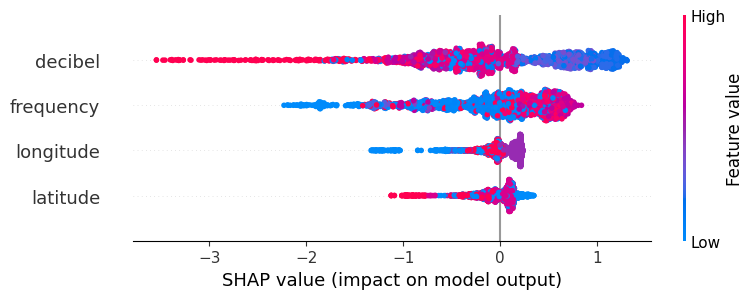

In [ ]:
import shap
import numpy as np
import pandas as pd
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler

# Step 1: Load Anomaly Data
df_anomalies = df_anomalies.copy()  # Ensure we work on a copy to avoid modification issues

# Step 2: Select Features for Explanation
features = ["frequency", "decibel", "latitude", "longitude"]  # Using numerical features only
df_features = df_anomalies[features]

# Step 3: Standardize Data (Improves SHAP explanations)
scaler = StandardScaler()
df_features_scaled = scaler.fit_transform(df_features)

# Step 4: Train an AI Model (Isolation Forest)
iso_forest = IsolationForest(contamination=0.05, random_state=42)
iso_forest.fit(df_features_scaled)

# Step 5: Use SHAP to Explain Anomalies (Fix: Disable additivity check)
explainer = shap.Explainer(iso_forest, df_features_scaled)
shap_values = explainer(df_features_scaled, check_additivity=False)

# Step 6: Visualize SHAP Summary (What Features Contribute to Anomalies)
shap.summary_plot(shap_values, features=df_features, feature_names=features)


In [ ]:
# Define frequency bands and their applications based on FCC data
frequency_bands = [
    {"application": "AM Radio", "min_freq": 0.525e6, "max_freq": 1.705e6},  # 525 kHz - 1705 kHz
    {"application": "FM Radio", "min_freq": 88e6, "max_freq": 108e6},       # 88 MHz - 108 MHz
    {"application": "GSM 900", "min_freq": 880e6, "max_freq": 960e6},      # 880 MHz - 960 MHz
    {"application": "GSM 1800", "min_freq": 1710e6, "max_freq": 1880e6},   # 1710 MHz - 1880 MHz
    {"application": "WiFi 2.4 GHz", "min_freq": 2400e6, "max_freq": 2500e6},# 2.4 GHz Band
    {"application": "WiFi 5 GHz", "min_freq": 5150e6, "max_freq": 5850e6},  # 5 GHz Band
    {"application": "Bluetooth", "min_freq": 2400e6, "max_freq": 2483.5e6}, # Bluetooth uses the 2.4 GHz band
    {"application": "Satellite Communication (L Band)", "min_freq": 1525e6, "max_freq": 1559e6},  # L-Band for GPS, SatCom
    {"application": "Satellite Communication (Ku Band)", "min_freq": 10.7e9, "max_freq": 12.75e9},# Ku Band
    {"application": "5G Sub-6 GHz", "min_freq": 3300e6, "max_freq": 4200e6},# 5G Frequencies (Sub-6 GHz)
    {"application": "5G mmWave", "min_freq": 24.25e9, "max_freq": 52.6e9}   # 5G mmWave Frequencies
]

# Function to map frequency to application
def get_application(frequency):
    for band in frequency_bands:
        if band["min_freq"] <= frequency <= band["max_freq"]:
            return band["application"]
    return "Unknown Application"

# Apply mapping function
df_anomalies["application"] = df_anomalies["frequency"].apply(get_application)

# Display the dataframe
print(df_anomalies)


          frequency  decibel   latitude  longitude                 timestamp  \
49518  1.000000e+06    7.483  43.488884  -80.49148 2025-02-26 12:30:42+00:00   
50967  1.000000e+06    7.519  43.488884  -80.49148 2025-02-26 13:00:08+00:00   
49520  1.381081e+07  -94.118  43.488884  -80.49148 2025-02-26 12:30:42+00:00   
50969  1.381081e+07  -97.068  43.488884  -80.49148 2025-02-26 13:00:08+00:00   
49521  2.021622e+07  -93.758  43.488884  -80.49148 2025-02-26 12:30:42+00:00   
...             ...      ...        ...        ...                       ...   
50516  6.393595e+09  -82.785  43.488884  -80.49148 2025-02-26 12:30:42+00:00   
50517  6.400000e+09  -83.361  43.488884  -80.49148 2025-02-26 12:30:42+00:00   
51966  6.400000e+09  -83.397  43.488884  -80.49148 2025-02-26 13:00:08+00:00   
50966  6.400000e+09  -72.094  43.488884  -80.49148 2025-02-26 12:49:54+00:00   
52415  6.400000e+09  -72.156  43.488884  -80.49148 2025-02-28 21:56:38+00:00   

       timestamp_numeric  rolling_mean 

In [ ]:
df_anomalies

,frequency,decibel,latitude,longitude,timestamp,timestamp_numeric,rolling_mean,rolling_std,spike_rolling,spike_iqr,is_anomaly,final_anomaly,anomaly_label,frequency_GHz,frequency_MHz,application
49518,1.000000e+06,7.483,43.488884,-80.49148,2025-02-26 12:30:42+00:00,1.740573e+09,NaN,NaN,False,True,-1,True,Anomaly (Spike),0.001000,1.000000,AM Radio
50967,1.000000e+06,7.519,43.488884,-80.49148,2025-02-26 13:00:08+00:00,1.740575e+09,NaN,NaN,False,True,-1,True,Anomaly (Spike),0.001000,1.000000,AM Radio
49520,1.381081e+07,-94.118,43.488884,-80.49148,2025-02-26 12:30:42+00:00,1.740573e+09,-89.7967,3.662615,False,False,-1,True,Anomaly (Spike),0.013811,13.810811,Unknown Application
50969,1.381081e+07,-97.068,43.488884,-80.49148,2025-02-26 13:00:08+00:00,1.740575e+09,-89.4311,4.214216,False,False,-1,True,Anomaly (Spike),0.013811,13.810811,Unknown Application
49521,2.021622e+07,-93.758,43.488884,-80.49148,2025-02-26 12:30:42+00:00,1.740573e+09,-89.2099,2.748350,False,False,-1,True,Anomaly (Spike),0.020216,20.216216,Unknown Application
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50516,6.393595e+09,-82.785,43.488884,-80.49148,2025-02-26 12:30:42+00:00,1.740573e+09,-78.8121,5.667525,False,False,-1,True,Anomaly (Spike),6.393595,6393.594595,Unknown Application
50517,6.400000e+09,-83.361,43.488884,-80.49148,2025-02-26 12:30:42+00:00,1.740573e+09,NaN,NaN,False,False,-1,True,Anomaly (Spike),6.400000,6400.000000,Unknown Application
51966,6.400000e+09,-83.397,43.488884,-80.49148,2025-02-26 13:00:08+00:00,1.740575e+09,NaN,NaN,False,False,-1,True,Anomaly (Spike),6.400000,6400.000000,Unknown Application
50966,6.400000e+09,-72.094,43.488884,-80.49148,2025-02-26 12:49:54+00:00,1.740574e+09,NaN,NaN,False,False,-1,True,Anomaly (Spike),6.400000,6400.000000,Unknown Application


## export result as file

In [ ]:
# Export df_anomalies to a CSV file
csv_filename = "df_anomalies.csv"
df_anomalies.to_csv(csv_filename, index=False)

# Download the CSV file
from google.colab import files
files.download(csv_filename)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>